In [ ]:
from imblearn.over_sampling import SMOTE
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import LabelEncoder, StandardScaler

df = pd.read_csv("Gen 21 - FTA Program.csv")

X_scaled = df.copy()

cat_cols = df.select_dtypes(include=['object']).columns

encoders = {}
for col in cat_cols:
    label_encoder = LabelEncoder()
    X_scaled[col] = X_scaled[col].fillna(X_scaled[col].mode()[0])
    X_scaled[col] = label_encoder.fit_transform(X_scaled[col])
    encoders[col] = label_encoder

def smote_like_group(
    data: pd.DataFrame,
    group_col: str,
    target_ratio: float = 0.95,  # e.g., make smaller groups reach 95% of max
    n_neighbors: int = 5,
    random_state: int = 42
):
    np.random.seed(random_state)
    df_list = []
    
    # Get group counts and max
    group_sizes = data[group_col].value_counts()
    max_count = group_sizes.max()
    
    for g, count in group_sizes.items():
        group_df = data[data[group_col] == g]
        df_list.append(group_df)
        
        target_size = int(max_count * target_ratio)
        
        # Only oversample if current group smaller than target
        if count < target_size and len(group_df) > 1:
            n_samples_to_generate = target_size - count
            
            # Fit k-NN
            nbrs = NearestNeighbors(n_neighbors=min(n_neighbors, len(group_df))).fit(group_df.drop(columns=[group_col]))
            synthetic_samples = []
            
            for _ in range(n_samples_to_generate):
                i = np.random.randint(0, len(group_df))
                neighbors = nbrs.kneighbors([group_df.drop(columns=[group_col]).iloc[i]], return_distance=False)
                
                # Handle case when group too small for full neighbors
                if len(neighbors[0]) > 1:
                    neighbor_idx = np.random.choice(neighbors[0][1:])
                else:
                    neighbor_idx = neighbors[0][0]
                    
                neighbor = group_df.drop(columns=[group_col]).iloc[neighbor_idx]
                diff = neighbor - group_df.drop(columns=[group_col]).iloc[i]
                new_point = group_df.drop(columns=[group_col]).iloc[i] + np.random.rand() * diff
                synthetic_samples.append(new_point)
            
            synth_df = pd.DataFrame(synthetic_samples, columns=group_df.drop(columns=[group_col]).columns)
            synth_df[group_col] = g  # reattach the group column
            df_list.append(synth_df)
    
    resampled_df = pd.concat(df_list, ignore_index=True)
    return resampled_df

def unsupervised_smote_like(data, n_samples):
    data = np.array(data)
    nbrs = NearestNeighbors(n_neighbors=5).fit(data)
    synthetic = []
    for _ in range(n_samples):
        i = np.random.randint(0, len(data))
        neighbors = nbrs.kneighbors([data[i]], return_distance=False)
        neighbor = data[np.random.choice(neighbors[0][1:])]
        diff = neighbor - data[i]
        new_point = data[i] + np.random.rand() * diff
        synthetic.append(new_point)
    return np.vstack([data, synthetic])


# resampled = unsupervised_smote_like(X_scaled, n_samples=10000)
# resampled_df = pd.DataFrame(resampled, columns=X_scaled.columns)
# resampled_df.reset_index(drop=True)

# smote_like = smote_like_group(resampled_df, group_col='PROGRAM_GEN', target_ratio=0.6)
# smote_like_df = pd.DataFrame(smote_like, columns=resampled_df.columns)
# smote_like_df.reset_index(drop=True)

# smote_like = smote_like_group(X_scaled, group_col='PROGRAM_GEN', target_ratio=0.6)
# smote_like_df = pd.DataFrame(smote_like, columns=X_scaled.columns)
# smote_like_df.reset_index(drop=True)

/opt/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/p

,PROGRAM_GEN,CONC_CDTP,ID_CHANNEL,TX_CODE,CBS_DATE,SLOT_TTIME,SLOT_DUR,ID_PROGRAM_GEN,CB_DUR_AVAIL,CB_DUR_USED,CB_DUR_USED_ROS,CB_DUR_TOTAL,BUMP_DUR_USED,ID_DAYPART
0,2.000000,2074.000000,1.0,5.0,26.000000,48.000000,4.000000,23.000000,60.000000,180.000000,0.0,240.000000,0.0,3.000000
1,2.000000,2103.000000,1.0,6.0,24.000000,48.000000,4.000000,23.000000,60.000000,180.000000,0.0,240.000000,0.0,3.000000
2,2.000000,2059.000000,1.0,5.0,11.000000,48.000000,4.000000,23.000000,60.000000,180.000000,0.0,240.000000,0.0,3.000000
3,2.000000,2051.000000,1.0,5.0,3.000000,48.000000,4.000000,23.000000,60.000000,180.000000,0.0,240.000000,0.0,3.000000
4,2.000000,1555.000000,1.0,2.0,2.000000,48.000000,4.000000,23.000000,240.000000,0.000000,0.0,240.000000,0.0,3.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78133,115.879942,639.106881,2.0,3.0,1.000000,41.947290,41.200585,3477.879942,103.199123,234.399708,0.0,337.598830,0.0,3.120058
78134,101.167986,1471.256794,2.0,3.0,29.664027,57.000000,120.000000,3461.167986,992.401027,57.598973,0.0,1050.000000,0.0,4.000000
78135,93.069114,1010.034557,2.0,3.0,14.000000,27.845032,97.759178,3449.586393,348.361233,251.638767,0.0,600.000000,0.0,2.258639
78136,64.683021,1715.304066,1.0,4.0,6.595868,15.421562,15.752743,280.293092,105.247257,0.000000,0.0,105.247257,0.0,1.491285


PROGRAM_GEN
2.000000      1083
65.000000      649
9.000000       649
13.000000      649
31.000000      649
              ... 
64.322742        1
82.651533        1
26.975331        1
104.034641       1
96.632781        1
Name: count, Length: 3832, dtype: int64


/var/folders/m7/sjw8yb_1677_b06x0yxyy00m0000gq/T/ipykernel_34926/3657533254.py:5: UserWarning: Discarding nonzero nanoseconds in conversion.
  last_year = smote_like_df['CBS_DATE'].max() - pd.DateOffset(years=1)


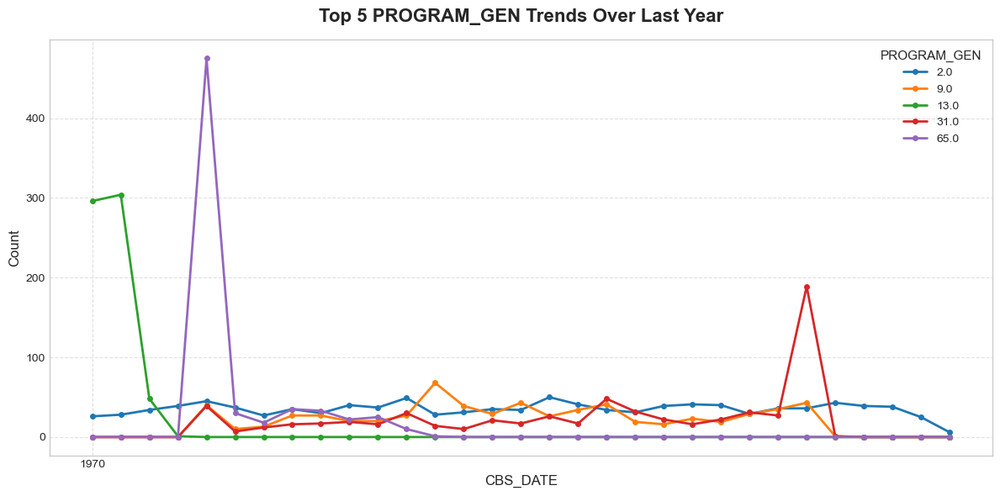

In [ ]:
# print(smote_like_df['PROGRAM_GEN'].value_counts())

# smote_like_df['CBS_DATE'] = pd.to_datetime(smote_like_df['CBS_DATE'])

# last_year = smote_like_df['CBS_DATE'].max() - pd.DateOffset(years=1)
# df_last_year = smote_like_df[smote_like_df['CBS_DATE'] >= last_year]

# # --- 2️⃣ Find top 5 PROGRAM_GEN across all time ---
# top5_gen = (
#     smote_like_df['PROGRAM_GEN']
#     .value_counts()
#     .nlargest(5)
#     .index
# )

# # --- 3️⃣ Filter only top 5 PROGRAM_GEN in last year data ---
# df_top5 = df_last_year[df_last_year['PROGRAM_GEN'].isin(top5_gen)]

# # --- 4️⃣ Group by CBS_DATE and PROGRAM_GEN ---
# counts = (
#     df_top5
#     .groupby(['CBS_DATE', 'PROGRAM_GEN'])
#     .size()
#     .reset_index(name='count')
# )

# # --- 5️⃣ Pivot for plotting ---
# pivot_df = (
#     counts
#     .pivot(index='CBS_DATE', columns='PROGRAM_GEN', values='count')
#     .fillna(0)
# )

# # --- 6️⃣ Plot beautiful time series ---
# plt.style.use('seaborn-v0_8-whitegrid')
# plt.figure(figsize=(12, 6))

# for col in pivot_df.columns:
#     plt.plot(
#         pivot_df.index,
#         pivot_df[col],
#         linewidth=2,
#         marker='o',
#         markersize=4,
#         label=col
#     )

# plt.title('Top 5 PROGRAM_GEN Trends Over Last Year', fontsize=16, fontweight='bold', pad=15)
# plt.xlabel('CBS_DATE', fontsize=12)
# plt.ylabel('Count', fontsize=12)
# plt.legend(title='PROGRAM_GEN', fontsize=10, title_fontsize=11)
# plt.grid(True, linestyle='--', alpha=0.6)
# plt.tight_layout()
# plt.show()

In [ ]:

# df_inverse = smote_like_df.copy()

# for column in cat_cols:
#     encoder = encoders[column]
#     df_inverse[column] = encoder.inverse_transform(smote_like_df[column].astype(int))
# df_inverse.to_csv('Gen 21 - FTA Program.csv(oversampling).csv', index=False)


In [ ]:
# df_inverse['CBS_DATE'] = pd.to_datetime(df_inverse['CBS_DATE'])

# # Generate 2 extra "years" of synthetic data
# synthetic_dfs = []
# for year_shift in [1,2]:
#     temp = df_inverse.copy()
#     temp['CBS_DATE'] = temp['CBS_DATE'] - pd.DateOffset(years=year_shift)
#     synthetic_dfs.append(temp)

# df_extended = pd.concat([df_inverse] + synthetic_dfs, ignore_index=True)

# df_extended.to_csv('Gen 21 - FTA Program.csv(oversampling-years).csv', index=False)

/var/folders/m7/sjw8yb_1677_b06x0yxyy00m0000gq/T/ipykernel_34926/612699505.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_inverse['CBS_DATE'] = pd.to_datetime(df_inverse['CBS_DATE'])


  Channel  Impressions_%      GRP_%  Conversions_%
0    RCTI      35.820896  33.802817      34.883721
1  MNC TV      28.358209  26.760563      27.906977
2     GTV      20.895522  22.535211      20.930233
3   iNews      14.925373  16.901408      16.279070


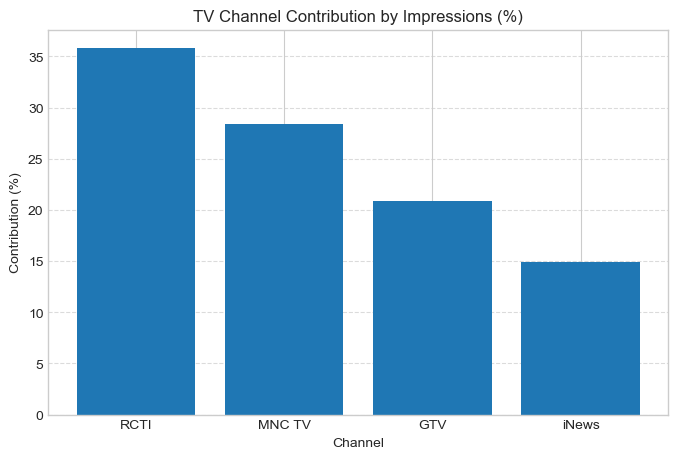

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# Example dataset
data = {
    "Channel": ["RCTI", "MNC TV", "GTV", "iNews"],
    "Spend": [200000000, 150000000, 100000000, 80000000],
    "Impressions": [1200000, 950000, 700000, 500000],
    "GRP": [120, 95, 80, 60],
    "Conversions": [1500, 1200, 900, 700]
}

df = pd.DataFrame(data)

# Calculate contribution %
for metric in ["Impressions", "GRP", "Conversions"]:
    df[f"{metric}_%"] = df[metric] / df[metric].sum() * 100

# Revenue = Conversions * 250000
# ROI = (Revenue - Spend) / Spend
# CPC = Spend / Conversions

# Impressions_Contribution = Impressions / SUM(Impressions)

# Bar Chart 1: Channel vs ROI
# Bar Chart 2: Channel vs CPC
# Optionally, color ROI bars by Spend intensity (using gradient color).

# Display results
print(df[["Channel", "Impressions_%", "GRP_%", "Conversions_%"]])

# Plot: Channel Contribution (Impressions %)
plt.figure(figsize=(8, 5))
plt.bar(df["Channel"], df["Impressions_%"])
plt.title("TV Channel Contribution by Impressions (%)")
plt.xlabel("Channel")
plt.ylabel("Contribution (%)")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# df.to_csv('Channel-Distribution.csv', index=False)



In [14]:
import pandas as pd

# --- Individual media datasets ---
fta_data = {
    "Channel": ["RCTI", "MNC TV", "GTV", "iNews"],
    "Spend": [200_000_000, 150_000_000, 100_000_000, 80_000_000],
    "Impressions": [1_200_000, 950_000, 700_000, 500_000],
    "GRP": [120, 95, 80, 60],
    "Conversions": [1500, 1200, 900, 700],
    "Media_Type": ["FTA"] * 4
}

dth_data = {
    "Channel": ["MNC Vision", "K-Vision", "Vision+", "MNC Play"],
    "Spend": [120_000_000, 100_000_000, 90_000_000, 85_000_000],
    "Impressions": [900_000, 850_000, 800_000, 750_000],
    "GRP": [100, 95, 90, 85],
    "Conversions": [1300, 1200, 1100, 1000],
    "Media_Type": ["DTH"] * 4
}

kol_data = {
    "Channel": ["Luna Maya", "Fadil Jaidi", "Arief Muhammad", "Prily LatuConsina"],
    "Spend": [50_000_000, 40_000_000, 35_000_000, 25_000_000],
    "Impressions": [600_000, 500_000, 450_000, 300_000],
    "GRP": [70, 60, 55, 45],
    "Conversions": [800, 650, 550, 400],
    "Media_Type": ["KOL"] * 4
}

# --- Combine all into one ---
df = pd.concat([pd.DataFrame(fta_data),
                pd.DataFrame(dth_data),
                pd.DataFrame(kol_data)],
               ignore_index=True)

# Display combined dataset
# df.to_csv('Media-Constribution.csv', index=False)


In [15]:
import pandas as pd
from datetime import date, timedelta
# Current date
today = date.today()

# Create dataframe (same as your SQL UNNEST + STRUCT)
data = [
    ["Client A", "Segment 1", "Facebook", "Video", 1200, 100, 10, 850, 1500000, 0.85, 500.0, 600.0, today - timedelta(days=10)],
    ["Client A", "Segment 2", "Instagram", "Image", 1500, 130, 12, 900, 1600000, 1.05, 600.0, 650.0, today - timedelta(days=9)],
    ["Client B", "Segment 1", "YouTube", "Video", 1800, 160, 18, 1100, 2000000, 1.20, 800.0, 850.0, today - timedelta(days=8)],
    ["Client B", "Segment 2", "Google Ads", "Search", 2200, 190, 20, 1250, 2300000, 1.40, 900.0, 950.0, today - timedelta(days=7)],
    ["Client C", "Segment 3", "TikTok", "Video", 1400, 110, 9, 870, 1400000, 0.95, 550.0, 600.0, today - timedelta(days=6)],
    ["Client C", "Segment 2", "KOL", "Influencer", 900, 70, 5, 500, 1200000, 1.10, 450.0, 500.0, today - timedelta(days=5)],
    ["Client D", "Segment 1", "DTH", "TV", 1700, 150, 13, 1300, 2500000, 1.30, 700.0, 800.0, today - timedelta(days=4)],
    ["Client D", "Segment 2", "FTV", "TV", 1600, 145, 12, 1250, 2400000, 1.25, 650.0, 750.0, today - timedelta(days=3)],
    ["Client E", "Segment 3", "Social", "Digital", 1300, 120, 11, 1000, 1900000, 1.10, 600.0, 700.0, today - timedelta(days=2)],
    ["Client E", "Segment 3", "OOH", "Billboard", 1000, 90, 8, 800, 1700000, 0.90, 550.0, 650.0, today - timedelta(days=1)]
]

columns = [
    "client_name", "segment", "channel", "media_type", "impressions", "clicks",
    "conversions", "reach", "revenue", "roi", "spend", "budget", "performance_date"
]

# Create DataFrame
df_media_insight = pd.DataFrame(data, columns=columns)

X_scaled = df_media_insight.copy()

cat_cols = df_media_insight.select_dtypes(include=['object']).columns

encoders = {}
for col in cat_cols:
    label_encoder = LabelEncoder()
    X_scaled[col] = X_scaled[col].fillna(X_scaled[col].mode()[0])
    X_scaled[col] = label_encoder.fit_transform(X_scaled[col])
    encoders[col] = label_encoder

# Show result
resampled = unsupervised_smote_like(X_scaled, n_samples=1000)
resampled_df = pd.DataFrame(resampled, columns=X_scaled.columns)
resampled_df.reset_index(drop=True)

smote_like = smote_like_group(resampled_df, group_col='channel', target_ratio=0.6)
smote_like_df = pd.DataFrame(smote_like, columns=resampled_df.columns)
smote_like_df.reset_index(drop=True)

df_inverse = smote_like_df.copy()

for column in cat_cols:
    encoder = encoders[column]
    df_inverse[column] = encoder.inverse_transform(smote_like_df[column].astype(int))

df_inverse.to_csv('media-insight.csv', index=False)